In [1]:
#!for a in /sys/bus/pci/devices/*; do echo 0 | sudo tee -a $a/numa_node; done
import tensorflow as tf
import matplotlib.pyplot as plt
import os
from data_processing import dataset
from models import model
from utils import tools
from plots import plots, edge_detection_plots

os.environ['TF_FORCE_GPU_ALLOW_GROWTH'] = 'true'
import numpy as np
import sys
np.set_printoptions(threshold=sys.maxsize)

2023-02-01 22:32:34.686368: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F AVX512_VNNI FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-02-01 22:32:34.779488: I tensorflow/core/util/util.cc:169] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2023-02-01 22:32:34.801292: E tensorflow/stream_executor/cuda/cuda_blas.cc:2981] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2023-02-01 22:32:35.223895: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer.so.7'; 

In [2]:
config_directory = 'lite_edge'

config_path = os.path.join(os.getcwd(), 'configs', config_directory)
DataProcessing = dataset.DataProcessing(config_path=config_path)
Model = model.Model(config_path)
tools.parser(Model.cfg, DataProcessing.cfg)
Model.load_data(DataProcessing.cfg["NAME"])
DataProcessing.load_dataset_information()

2023-02-01 22:32:36.340866: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:980] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2023-02-01 22:32:36.344516: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:980] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2023-02-01 22:32:36.344698: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:980] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2023-02-01 22:32:36.345315: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F AVX512_VNNI FMA
To enable them in other operations, rebuild TensorFlow with the approp

# Load Dataset, Preprocess Images and Dataset

The TRAIN DS contains 1500 images.
The TEST DS contains 300 images.
The REAL_WORLD DS contains 41 images.


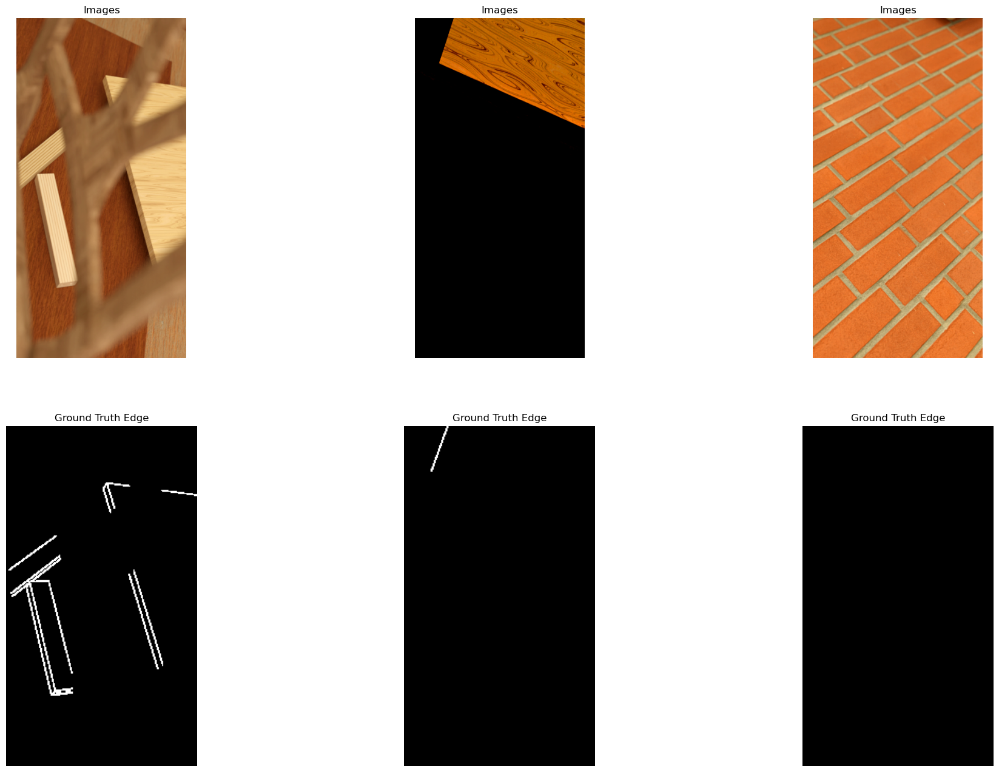

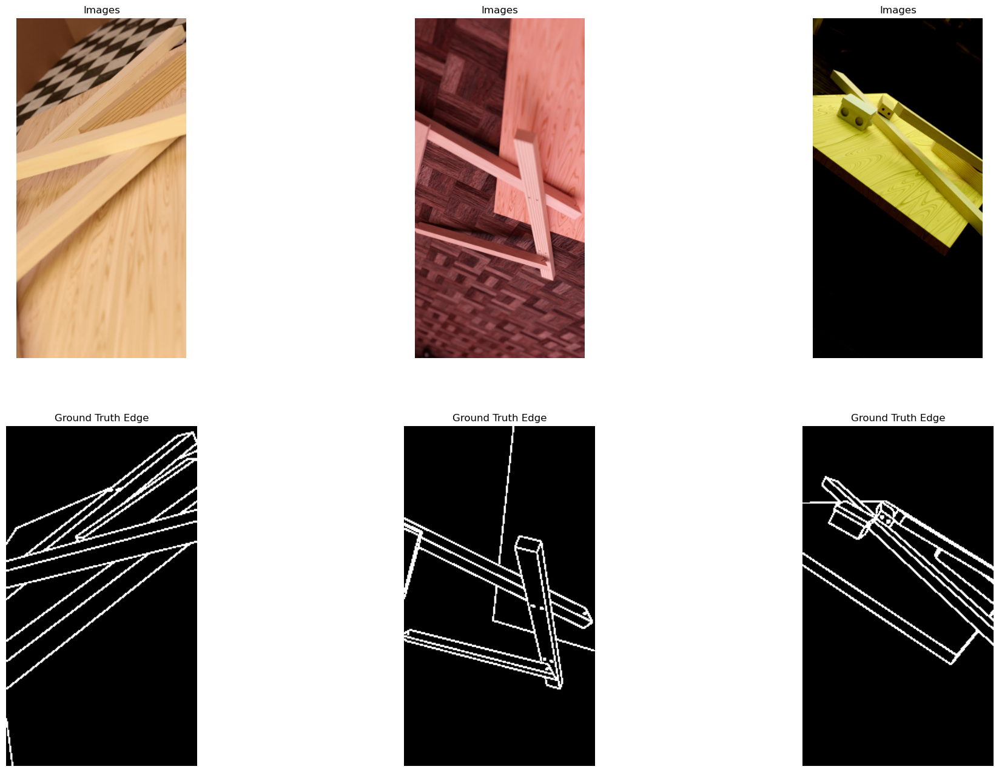

In [3]:
if Model.train_model:
    train_ds, img_count_train = DataProcessing.load_dataset(DataProcessing.key.train)
test_ds, img_count_test = DataProcessing.load_dataset(DataProcessing.key.test)

real_world_ds, img_count_real_world_ds = DataProcessing.load_dataset(DataProcessing.key.real_world)

if Model.train_model:
    for inp, out in train_ds.take(2):
        edge_detection_plots.plot_edges(images=inp['in_img'], labels_edge=out['out_edge'],
                                        batch_size=DataProcessing.cfg['TEST']['BATCH_SIZE'])

# Define, Compile and Train Model

In [4]:
if Model.train_model:
    model = Model.get_neural_network_model(DataProcessing.input_data_cfg, DataProcessing.output_data_cfg)
    # model.summary()

    lr = Model.get_lr(img_count_train, DataProcessing.cfg['TRAIN']['BATCH_SIZE'])
    model.compile(optimizer=tf.keras.optimizers.Adam(lr),
                  loss=Model.get_loss_function(DataProcessing.output_data_cfg),
                  metrics=Model.get_metrics(DataProcessing.output_data_cfg))

    history = model.fit(train_ds, epochs=Model.cfg["EPOCHS"], validation_data=test_ds,
                        callbacks=Model.get_callbacks(), verbose=1)

model = Model.get_best_model_from_checkpoints()

Epoch 1/200


2023-02-01 22:32:51.730893: I tensorflow/stream_executor/cuda/cuda_dnn.cc:384] Loaded cuDNN version 8100
2023-02-01 22:32:52.908432: I tensorflow/stream_executor/cuda/cuda_blas.cc:1614] TensorFloat-32 will be used for the matrix multiplication. This will only be logged once.


500/500 [==============================] - 57s 99ms/step - loss: 3321.2271 - accuracy: 0.9567 - accuracy_edge_1: 0.9567 - f1_edge: 0.6771 - precision_edge: 0.6585 - recall_edge: 0.6977 - f1_edge_1: 0.6771 - precision_edge_1: 0.6585 - recall_edge_1: 0.6977 - val_loss: 2748.5659 - val_accuracy: 0.9698 - val_accuracy_edge_1: 0.9698 - val_f1_edge: 0.7857 - val_precision_edge: 0.7420 - val_recall_edge: 0.8348 - val_f1_edge_1: 0.7857 - val_precision_edge_1: 0.7420 - val_recall_edge_1: 0.8348
Epoch 2/200
500/500 [==============================] - 49s 98ms/step - loss: 2472.2229 - accuracy: 0.9729 - accuracy_edge_1: 0.9729 - f1_edge: 0.7995 - precision_edge: 0.7764 - recall_edge: 0.8240 - f1_edge_1: 0.7995 - precision_edge_1: 0.7764 - recall_edge_1: 0.8240 - val_loss: 2304.7937 - val_accuracy: 0.9739 - val_accuracy_edge_1: 0.9739 - val_f1_edge: 0.8224 - val_precision_edge: 0.7491 - val_recall_edge: 0.9116 - val_f1_edge_1: 0.8224 - val_precision_edge_1: 0.7491 - val_recall_edge_1: 0.9116
Epoch 

INFO:tensorflow:Assets written to: /home/david/SemesterProject/Models/edge_detection/lite_edge/CKPT/ckpt-loss=1430.26-epoch=20.00-f1=0.9160/assets


INFO:tensorflow:Assets written to: /home/david/SemesterProject/Models/edge_detection/lite_edge/CKPT/ckpt-loss=1430.26-epoch=20.00-f1=0.9160/assets


500/500 [==============================] - 65s 131ms/step - loss: 1479.0249 - accuracy: 0.9884 - accuracy_edge_1: 0.9884 - f1_edge: 0.9148 - precision_edge: 0.9077 - recall_edge: 0.9221 - f1_edge_1: 0.9148 - precision_edge_1: 0.9077 - recall_edge_1: 0.9221 - val_loss: 1430.2633 - val_accuracy: 0.9887 - val_accuracy_edge_1: 0.9887 - val_f1_edge: 0.9160 - val_precision_edge: 0.9068 - val_recall_edge: 0.9254 - val_f1_edge_1: 0.9160 - val_precision_edge_1: 0.9068 - val_recall_edge_1: 0.9254
Epoch 21/200
500/500 [==============================] - 46s 91ms/step - loss: 1486.1521 - accuracy: 0.9886 - accuracy_edge_1: 0.9886 - f1_edge: 0.9150 - precision_edge: 0.9093 - recall_edge: 0.9207 - f1_edge_1: 0.9150 - precision_edge_1: 0.9093 - recall_edge_1: 0.9207 - val_loss: 1436.0028 - val_accuracy: 0.9895 - val_accuracy_edge_1: 0.9895 - val_f1_edge: 0.9212 - val_precision_edge: 0.9150 - val_recall_edge: 0.9275 - val_f1_edge_1: 0.9212 - val_precision_edge_1: 0.9150 - val_recall_edge_1: 0.9275
Epoc

INFO:tensorflow:Assets written to: /home/david/SemesterProject/Models/edge_detection/lite_edge/CKPT/ckpt-loss=1193.69-epoch=40.00-f1=0.9379/assets


INFO:tensorflow:Assets written to: /home/david/SemesterProject/Models/edge_detection/lite_edge/CKPT/ckpt-loss=1193.69-epoch=40.00-f1=0.9379/assets


500/500 [==============================] - 60s 121ms/step - loss: 1236.5914 - accuracy: 0.9909 - accuracy_edge_1: 0.9909 - f1_edge: 0.9315 - precision_edge: 0.9271 - recall_edge: 0.9360 - f1_edge_1: 0.9315 - precision_edge_1: 0.9271 - recall_edge_1: 0.9360 - val_loss: 1193.6940 - val_accuracy: 0.9917 - val_accuracy_edge_1: 0.9917 - val_f1_edge: 0.9379 - val_precision_edge: 0.9359 - val_recall_edge: 0.9398 - val_f1_edge_1: 0.9379 - val_precision_edge_1: 0.9359 - val_recall_edge_1: 0.9398
Epoch 41/200
500/500 [==============================] - 45s 89ms/step - loss: 1263.8982 - accuracy: 0.9912 - accuracy_edge_1: 0.9912 - f1_edge: 0.9331 - precision_edge: 0.9296 - recall_edge: 0.9367 - f1_edge_1: 0.9331 - precision_edge_1: 0.9296 - recall_edge_1: 0.9367 - val_loss: 1220.2194 - val_accuracy: 0.9915 - val_accuracy_edge_1: 0.9915 - val_f1_edge: 0.9366 - val_precision_edge: 0.9326 - val_recall_edge: 0.9406 - val_f1_edge_1: 0.9366 - val_precision_edge_1: 0.9326 - val_recall_edge_1: 0.9406
Epoc

INFO:tensorflow:Assets written to: /home/david/SemesterProject/Models/edge_detection/lite_edge/CKPT/ckpt-loss=1130.27-epoch=60.00-f1=0.9454/assets


INFO:tensorflow:Assets written to: /home/david/SemesterProject/Models/edge_detection/lite_edge/CKPT/ckpt-loss=1130.27-epoch=60.00-f1=0.9454/assets


500/500 [==============================] - 60s 120ms/step - loss: 1144.3344 - accuracy: 0.9926 - accuracy_edge_1: 0.9926 - f1_edge: 0.9426 - precision_edge: 0.9425 - recall_edge: 0.9428 - f1_edge_1: 0.9426 - precision_edge_1: 0.9425 - recall_edge_1: 0.9428 - val_loss: 1130.2719 - val_accuracy: 0.9927 - val_accuracy_edge_1: 0.9927 - val_f1_edge: 0.9454 - val_precision_edge: 0.9401 - val_recall_edge: 0.9509 - val_f1_edge_1: 0.9454 - val_precision_edge_1: 0.9401 - val_recall_edge_1: 0.9509
Epoch 61/200
500/500 [==============================] - 46s 92ms/step - loss: 1135.9696 - accuracy: 0.9923 - accuracy_edge_1: 0.9923 - f1_edge: 0.9425 - precision_edge: 0.9412 - recall_edge: 0.9438 - f1_edge_1: 0.9425 - precision_edge_1: 0.9412 - recall_edge_1: 0.9438 - val_loss: 1123.4286 - val_accuracy: 0.9927 - val_accuracy_edge_1: 0.9927 - val_f1_edge: 0.9447 - val_precision_edge: 0.9444 - val_recall_edge: 0.9451 - val_f1_edge_1: 0.9447 - val_precision_edge_1: 0.9444 - val_recall_edge_1: 0.9451
Epoc

INFO:tensorflow:Assets written to: /home/david/SemesterProject/Models/edge_detection/lite_edge/CKPT/ckpt-loss=1095.89-epoch=80.00-f1=0.9469/assets


INFO:tensorflow:Assets written to: /home/david/SemesterProject/Models/edge_detection/lite_edge/CKPT/ckpt-loss=1095.89-epoch=80.00-f1=0.9469/assets


500/500 [==============================] - 61s 121ms/step - loss: 1061.6127 - accuracy: 0.9936 - accuracy_edge_1: 0.9936 - f1_edge: 0.9525 - precision_edge: 0.9517 - recall_edge: 0.9534 - f1_edge_1: 0.9525 - precision_edge_1: 0.9517 - recall_edge_1: 0.9534 - val_loss: 1095.8873 - val_accuracy: 0.9929 - val_accuracy_edge_1: 0.9929 - val_f1_edge: 0.9469 - val_precision_edge: 0.9395 - val_recall_edge: 0.9544 - val_f1_edge_1: 0.9469 - val_precision_edge_1: 0.9395 - val_recall_edge_1: 0.9544
Epoch 81/200
500/500 [==============================] - 45s 90ms/step - loss: 1066.1781 - accuracy: 0.9929 - accuracy_edge_1: 0.9929 - f1_edge: 0.9465 - precision_edge: 0.9460 - recall_edge: 0.9470 - f1_edge_1: 0.9465 - precision_edge_1: 0.9460 - recall_edge_1: 0.9470 - val_loss: 1062.4845 - val_accuracy: 0.9930 - val_accuracy_edge_1: 0.9930 - val_f1_edge: 0.9481 - val_precision_edge: 0.9369 - val_recall_edge: 0.9596 - val_f1_edge_1: 0.9481 - val_precision_edge_1: 0.9369 - val_recall_edge_1: 0.9596
Epoc

INFO:tensorflow:Assets written to: /home/david/SemesterProject/Models/edge_detection/lite_edge/CKPT/ckpt-loss=975.94-epoch=100.00-f1=0.9538/assets


INFO:tensorflow:Assets written to: /home/david/SemesterProject/Models/edge_detection/lite_edge/CKPT/ckpt-loss=975.94-epoch=100.00-f1=0.9538/assets


500/500 [==============================] - 60s 121ms/step - loss: 978.9795 - accuracy: 0.9937 - accuracy_edge_1: 0.9937 - f1_edge: 0.9530 - precision_edge: 0.9527 - recall_edge: 0.9533 - f1_edge_1: 0.9530 - precision_edge_1: 0.9527 - recall_edge_1: 0.9533 - val_loss: 975.9386 - val_accuracy: 0.9938 - val_accuracy_edge_1: 0.9938 - val_f1_edge: 0.9538 - val_precision_edge: 0.9478 - val_recall_edge: 0.9599 - val_f1_edge_1: 0.9538 - val_precision_edge_1: 0.9478 - val_recall_edge_1: 0.9599
Epoch 101/200
500/500 [==============================] - 45s 90ms/step - loss: 990.0713 - accuracy: 0.9939 - accuracy_edge_1: 0.9939 - f1_edge: 0.9538 - precision_edge: 0.9532 - recall_edge: 0.9544 - f1_edge_1: 0.9538 - precision_edge_1: 0.9532 - recall_edge_1: 0.9544 - val_loss: 979.9128 - val_accuracy: 0.9940 - val_accuracy_edge_1: 0.9940 - val_f1_edge: 0.9547 - val_precision_edge: 0.9517 - val_recall_edge: 0.9578 - val_f1_edge_1: 0.9547 - val_precision_edge_1: 0.9517 - val_recall_edge_1: 0.9578
Epoch 1

INFO:tensorflow:Assets written to: /home/david/SemesterProject/Models/edge_detection/lite_edge/CKPT/ckpt-loss=950.67-epoch=120.00-f1=0.9549/assets


INFO:tensorflow:Assets written to: /home/david/SemesterProject/Models/edge_detection/lite_edge/CKPT/ckpt-loss=950.67-epoch=120.00-f1=0.9549/assets


500/500 [==============================] - 64s 129ms/step - loss: 943.8130 - accuracy: 0.9941 - accuracy_edge_1: 0.9941 - f1_edge: 0.9566 - precision_edge: 0.9577 - recall_edge: 0.9556 - f1_edge_1: 0.9566 - precision_edge_1: 0.9577 - recall_edge_1: 0.9556 - val_loss: 950.6667 - val_accuracy: 0.9940 - val_accuracy_edge_1: 0.9940 - val_f1_edge: 0.9549 - val_precision_edge: 0.9492 - val_recall_edge: 0.9608 - val_f1_edge_1: 0.9549 - val_precision_edge_1: 0.9492 - val_recall_edge_1: 0.9608
Epoch 121/200
500/500 [==============================] - 45s 90ms/step - loss: 934.6106 - accuracy: 0.9942 - accuracy_edge_1: 0.9942 - f1_edge: 0.9567 - precision_edge: 0.9570 - recall_edge: 0.9564 - f1_edge_1: 0.9567 - precision_edge_1: 0.9570 - recall_edge_1: 0.9564 - val_loss: 918.5345 - val_accuracy: 0.9944 - val_accuracy_edge_1: 0.9944 - val_f1_edge: 0.9576 - val_precision_edge: 0.9597 - val_recall_edge: 0.9555 - val_f1_edge_1: 0.9576 - val_precision_edge_1: 0.9597 - val_recall_edge_1: 0.9555
Epoch 1

INFO:tensorflow:Assets written to: /home/david/SemesterProject/Models/edge_detection/lite_edge/CKPT/ckpt-loss=913.83-epoch=140.00-f1=0.9560/assets


INFO:tensorflow:Assets written to: /home/david/SemesterProject/Models/edge_detection/lite_edge/CKPT/ckpt-loss=913.83-epoch=140.00-f1=0.9560/assets


500/500 [==============================] - 61s 123ms/step - loss: 882.1027 - accuracy: 0.9952 - accuracy_edge_1: 0.9952 - f1_edge: 0.9635 - precision_edge: 0.9646 - recall_edge: 0.9625 - f1_edge_1: 0.9635 - precision_edge_1: 0.9646 - recall_edge_1: 0.9625 - val_loss: 913.8313 - val_accuracy: 0.9941 - val_accuracy_edge_1: 0.9941 - val_f1_edge: 0.9560 - val_precision_edge: 0.9524 - val_recall_edge: 0.9597 - val_f1_edge_1: 0.9560 - val_precision_edge_1: 0.9524 - val_recall_edge_1: 0.9597
Epoch 141/200
500/500 [==============================] - 45s 90ms/step - loss: 878.5765 - accuracy: 0.9948 - accuracy_edge_1: 0.9948 - f1_edge: 0.9614 - precision_edge: 0.9628 - recall_edge: 0.9601 - f1_edge_1: 0.9614 - precision_edge_1: 0.9628 - recall_edge_1: 0.9601 - val_loss: 883.7250 - val_accuracy: 0.9949 - val_accuracy_edge_1: 0.9949 - val_f1_edge: 0.9619 - val_precision_edge: 0.9583 - val_recall_edge: 0.9655 - val_f1_edge_1: 0.9619 - val_precision_edge_1: 0.9583 - val_recall_edge_1: 0.9655
Epoch 1

INFO:tensorflow:Assets written to: /home/david/SemesterProject/Models/edge_detection/lite_edge/CKPT/ckpt-loss=830.04-epoch=160.00-f1=0.9656/assets


INFO:tensorflow:Assets written to: /home/david/SemesterProject/Models/edge_detection/lite_edge/CKPT/ckpt-loss=830.04-epoch=160.00-f1=0.9656/assets


500/500 [==============================] - 60s 120ms/step - loss: 848.9095 - accuracy: 0.9952 - accuracy_edge_1: 0.9952 - f1_edge: 0.9641 - precision_edge: 0.9655 - recall_edge: 0.9628 - f1_edge_1: 0.9641 - precision_edge_1: 0.9655 - recall_edge_1: 0.9628 - val_loss: 830.0413 - val_accuracy: 0.9954 - val_accuracy_edge_1: 0.9954 - val_f1_edge: 0.9656 - val_precision_edge: 0.9665 - val_recall_edge: 0.9647 - val_f1_edge_1: 0.9656 - val_precision_edge_1: 0.9665 - val_recall_edge_1: 0.9647
Epoch 161/200
500/500 [==============================] - 45s 90ms/step - loss: 851.6972 - accuracy: 0.9953 - accuracy_edge_1: 0.9953 - f1_edge: 0.9640 - precision_edge: 0.9653 - recall_edge: 0.9627 - f1_edge_1: 0.9640 - precision_edge_1: 0.9653 - recall_edge_1: 0.9627 - val_loss: 833.1712 - val_accuracy: 0.9954 - val_accuracy_edge_1: 0.9954 - val_f1_edge: 0.9649 - val_precision_edge: 0.9680 - val_recall_edge: 0.9618 - val_f1_edge_1: 0.9649 - val_precision_edge_1: 0.9680 - val_recall_edge_1: 0.9618
Epoch 1

INFO:tensorflow:Assets written to: /home/david/SemesterProject/Models/edge_detection/lite_edge/CKPT/ckpt-loss=821.42-epoch=180.00-f1=0.9645/assets


INFO:tensorflow:Assets written to: /home/david/SemesterProject/Models/edge_detection/lite_edge/CKPT/ckpt-loss=821.42-epoch=180.00-f1=0.9645/assets


500/500 [==============================] - 61s 122ms/step - loss: 814.5735 - accuracy: 0.9957 - accuracy_edge_1: 0.9957 - f1_edge: 0.9672 - precision_edge: 0.9683 - recall_edge: 0.9660 - f1_edge_1: 0.9672 - precision_edge_1: 0.9683 - recall_edge_1: 0.9660 - val_loss: 821.4226 - val_accuracy: 0.9953 - val_accuracy_edge_1: 0.9953 - val_f1_edge: 0.9645 - val_precision_edge: 0.9665 - val_recall_edge: 0.9625 - val_f1_edge_1: 0.9645 - val_precision_edge_1: 0.9665 - val_recall_edge_1: 0.9625
Epoch 181/200
500/500 [==============================] - 45s 90ms/step - loss: 805.2350 - accuracy: 0.9958 - accuracy_edge_1: 0.9958 - f1_edge: 0.9677 - precision_edge: 0.9688 - recall_edge: 0.9666 - f1_edge_1: 0.9677 - precision_edge_1: 0.9688 - recall_edge_1: 0.9666 - val_loss: 806.9424 - val_accuracy: 0.9956 - val_accuracy_edge_1: 0.9956 - val_f1_edge: 0.9669 - val_precision_edge: 0.9688 - val_recall_edge: 0.9650 - val_f1_edge_1: 0.9669 - val_precision_edge_1: 0.9688 - val_recall_edge_1: 0.9650
Epoch 1

INFO:tensorflow:Assets written to: /home/david/SemesterProject/Models/edge_detection/lite_edge/CKPT/ckpt-loss=782.77-epoch=200.00-f1=0.9683/assets


INFO:tensorflow:Assets written to: /home/david/SemesterProject/Models/edge_detection/lite_edge/CKPT/ckpt-loss=782.77-epoch=200.00-f1=0.9683/assets


500/500 [==============================] - 61s 121ms/step - loss: 780.3989 - accuracy: 0.9955 - accuracy_edge_1: 0.9955 - f1_edge: 0.9666 - precision_edge: 0.9677 - recall_edge: 0.9654 - f1_edge_1: 0.9666 - precision_edge_1: 0.9677 - recall_edge_1: 0.9654 - val_loss: 782.7712 - val_accuracy: 0.9958 - val_accuracy_edge_1: 0.9958 - val_f1_edge: 0.9683 - val_precision_edge: 0.9707 - val_recall_edge: 0.9659 - val_f1_edge_1: 0.9683 - val_precision_edge_1: 0.9707 - val_recall_edge_1: 0.9659
/home/david/SemesterProject/Models/edge_detection/lite_edge/CKPT/ckpt-loss=782.77-epoch=200.00-f1=0.9683


INFO:tensorflow:Assets written to: /home/david/SemesterProject/Models/edge_detection/lite_edge/assets


INFO:tensorflow:Assets written to: /home/david/SemesterProject/Models/edge_detection/lite_edge/assets


INFO:tensorflow:Assets written to: /home/david/SemesterProject/Models/edge_detection/lite_edge/TFLITE/assets


INFO:tensorflow:Assets written to: /home/david/SemesterProject/Models/edge_detection/lite_edge/TFLITE/assets


In [5]:
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 in_img (InputLayer)            [(None, 640, 320, 3  0           []                               
                                )]                                                                
                                                                                                  
 base_model (Functional)        [(None, 160, 80, 24  2257984     ['in_img[0][0]']                 
                                ),                                                                
                                 (None, 80, 40, 32)                                               
                                , (None, 40, 20, 64                                               
                                ),                                                            

                                                                                                  
 daspp_9_conv_relu (ReLU)       (None, 20, 10, 96)   0           ['daspp_9_conv_bn[0][0]']        
                                                                                                  
 concatenate (Concatenate)      (None, 20, 10, 1760  0           ['tf.image.resize[0][0]',        
                                )                                 'daspp_1_relu[0][0]',           
                                                                  'daspp_3_conv_relu[0][0]',      
                                                                  'daspp_6_conv_relu[0][0]',      
                                                                  'daspp_9_conv_relu[0][0]',      
                                                                  'base_model[0][5]']             
                                                                                                  
 conv2d (C

                                                                                                  
 conv2d_4 (Conv2D)              (None, 40, 20, 1)    21          ['re_lu_10[0][0]']               
                                                                                                  
 conv2d_5 (Conv2D)              (None, 20, 10, 1)    21          ['re_lu_12[0][0]']               
                                                                                                  
 separable_conv2d_2 (SeparableC  (None, 160, 80, 1)  961         ['re_lu_2[0][0]']                
 onv2D)                                                                                           
                                                                                                  
 batch_normalization_5 (BatchNo  (None, 160, 80, 1)  4           ['conv2d_1[0][0]']               
 rmalization)                                                                                     
          

# Plot Results

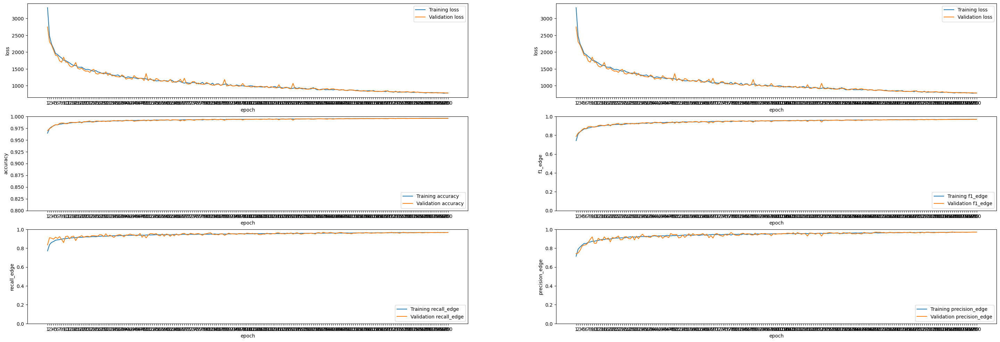

In [6]:
if Model.train_model:
    plot_losses = ["loss", "loss"]
    plot_metrics = ["accuracy", "f1_edge", "recall_edge", "precision_edge"]

    path = os.path.join(Model.Data.paths["FIGURES"], "training")

    plots.plot_training_history(history=history.history, list_of_loss_names=plot_losses,
                                list_of_metric_names=plot_metrics,
                                save=Model.cfg["SAVE"], path=path)

1/1 [==============================] - 0s 49ms/step


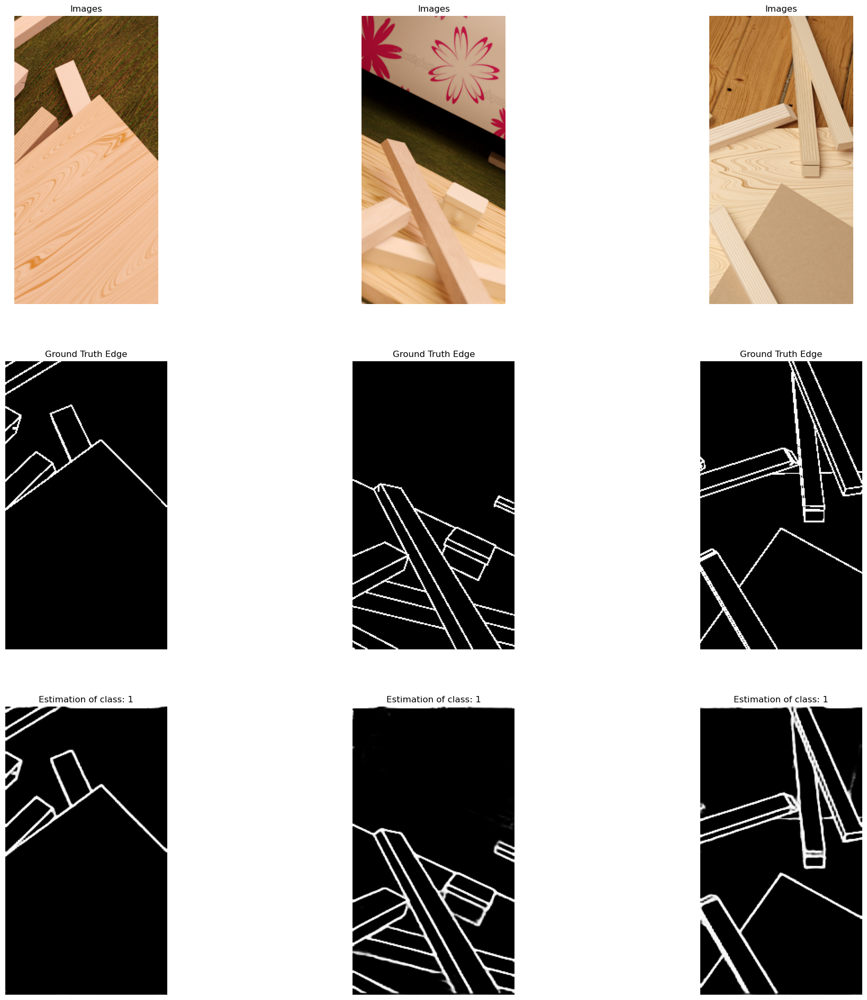

1/1 [==============================] - 0s 26ms/step


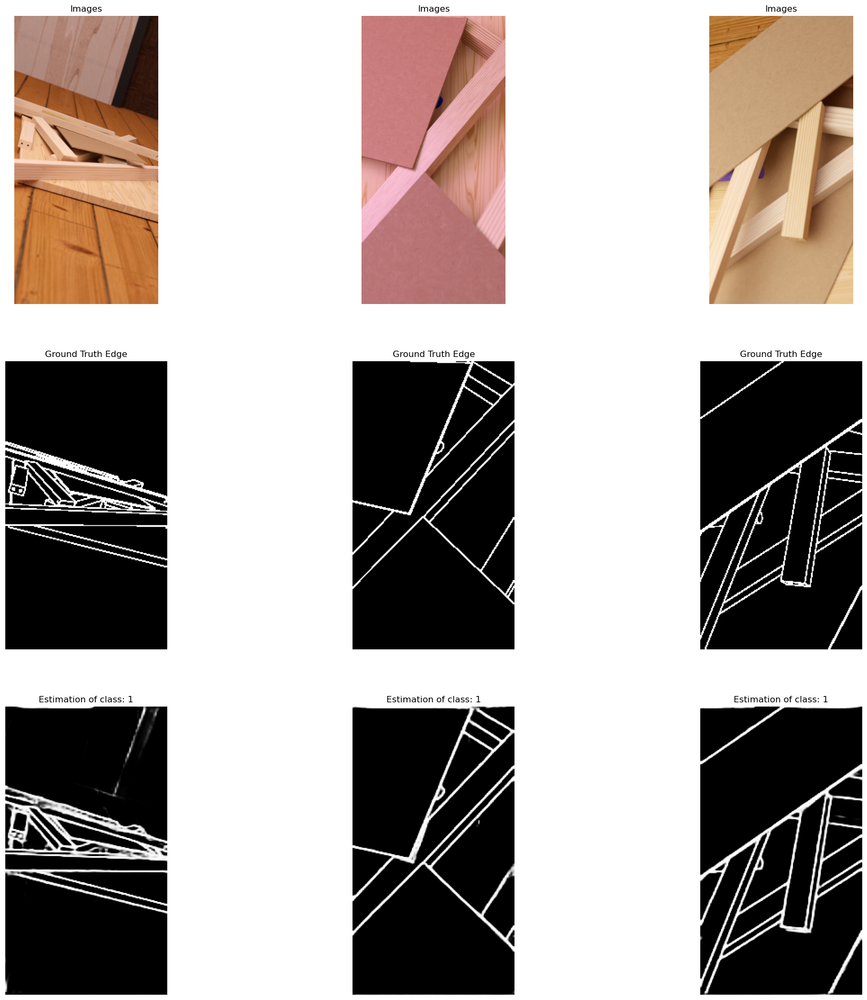

1/1 [==============================] - 0s 28ms/step


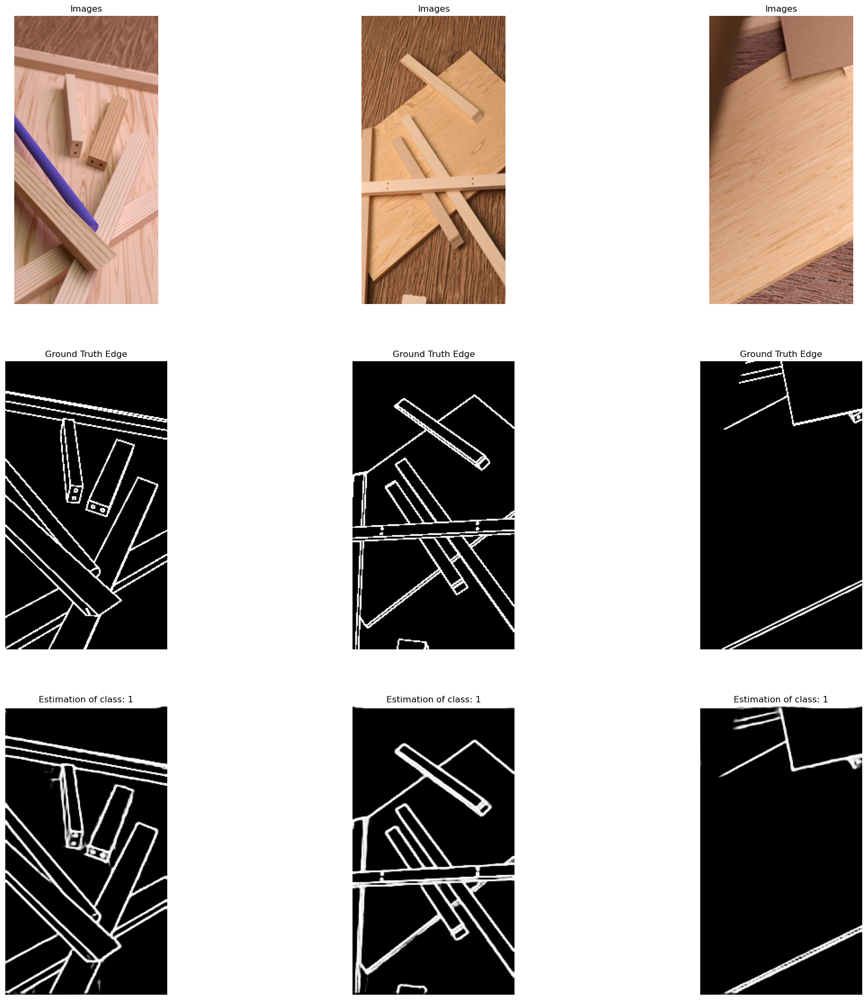

2023-02-02 08:08:26.724971: W tensorflow/core/kernels/data/cache_dataset_ops.cc:856] The calling iterator did not fully read the dataset being cached. In order to avoid unexpected truncation of the dataset, the partially cached contents of the dataset  will be discarded. This can happen if you have an input pipeline similar to `dataset.cache().take(k).repeat()`. You should use `dataset.take(k).cache().repeat()` instead.


In [8]:
i = 0
for inp, out in test_ds.take(3):
    pred = model.predict(inp)
    path = os.path.join(Model.Data.paths["FIGURES"], "sd_prediction_{}".format(i))
    edge_detection_plots.plot_edges(images=inp['in_img'],
                                    labels_edge=out['out_edge'],
                                    predictions_edge=pred,
                                    batch_size=DataProcessing.cfg['TEST']['BATCH_SIZE'],
                                   save=Model.cfg["SAVE"], path=path)
    i += 1

1/1 [==============================] - 0s 85ms/step


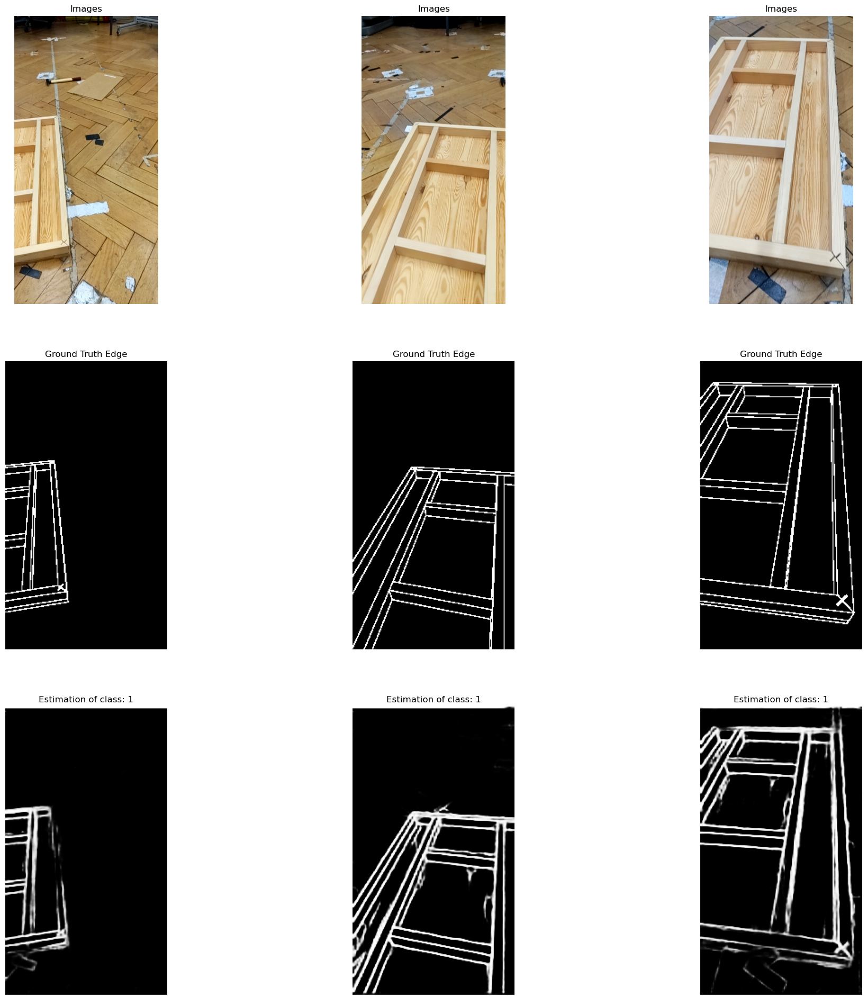

1/1 [==============================] - 0s 35ms/step


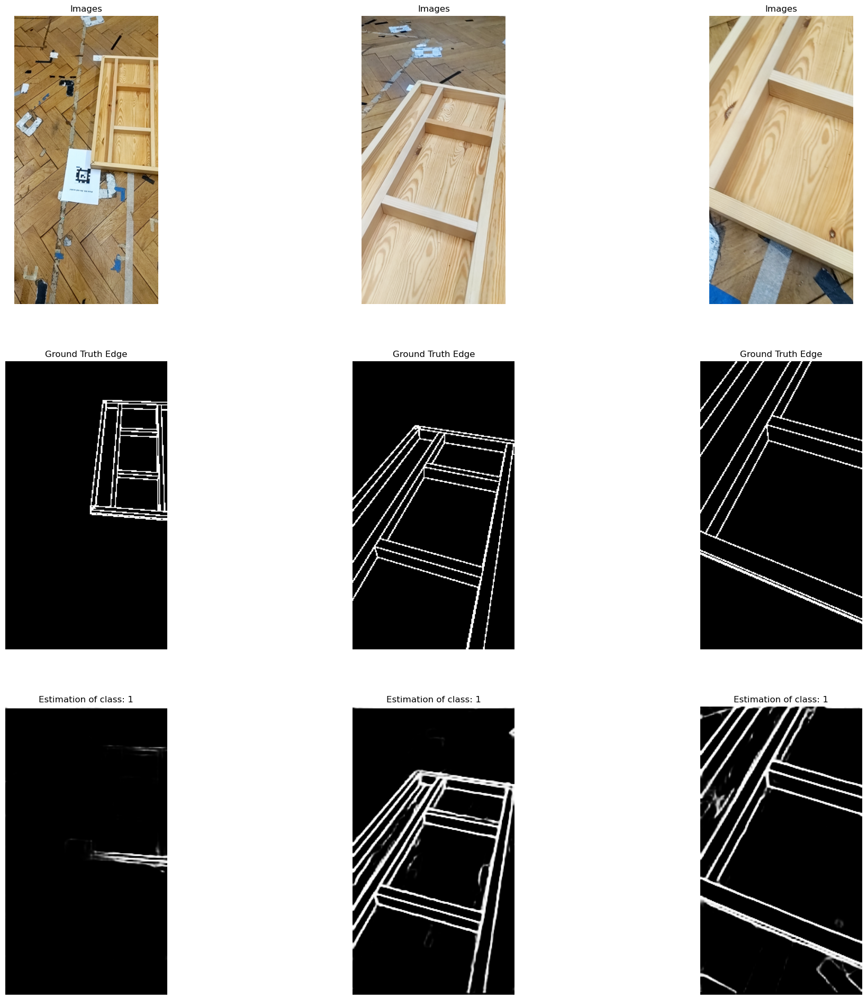

1/1 [==============================] - 0s 33ms/step


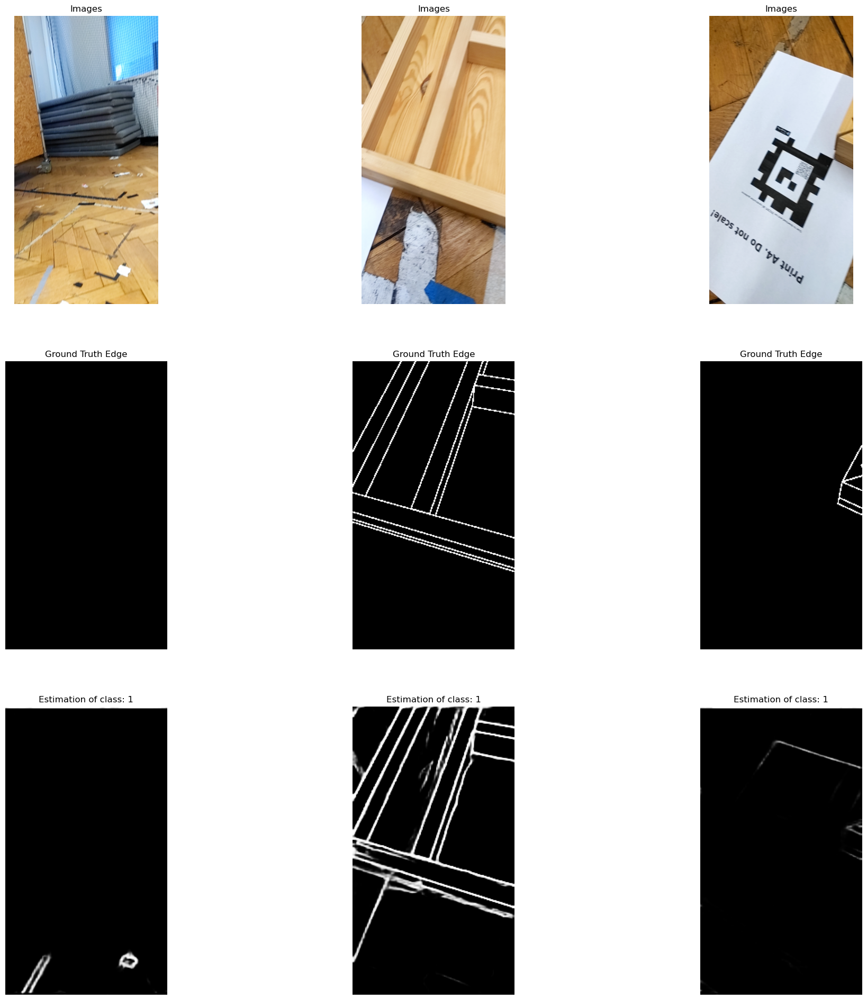

2023-02-02 08:08:43.808540: W tensorflow/core/kernels/data/cache_dataset_ops.cc:856] The calling iterator did not fully read the dataset being cached. In order to avoid unexpected truncation of the dataset, the partially cached contents of the dataset  will be discarded. This can happen if you have an input pipeline similar to `dataset.cache().take(k).repeat()`. You should use `dataset.take(k).cache().repeat()` instead.


In [9]:
i = 0
for inp, out in real_world_ds.take(3):
    pred = model.predict(inp)
    path = os.path.join(Model.Data.paths["FIGURES"], "rwd_prediction_{}".format(i))
    edge_detection_plots.plot_edges(images=inp['in_img'],
                                    labels_edge=out['out_edge'],
                                    predictions_edge=pred,
                                    batch_size=DataProcessing.cfg['TEST']['BATCH_SIZE'],
                                   save=Model.cfg["SAVE"], path=path)
    i += 1

Max Accuracy Score = 0.995 at 0.400
MF1 = 0.961
MF1_1 = 0.961, ODS_1 = 0.400


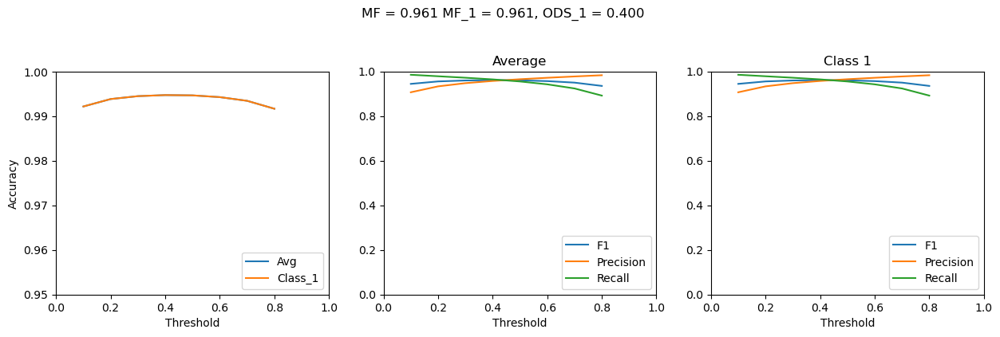

In [10]:
### Maximum F1 Score:
path = os.path.join(Model.Data.paths["FIGURES"], "threshold_metrics_evaluation_test_ds.svg")

Model.evaluate_and_plot_MF_score(model=model, dataset=test_ds, 
                                num_classes=DataProcessing.output_data_cfg["edge"]["num_classes"], path=path)

Max Accuracy Score = 0.979 at 0.800
MF1 = 0.842
MF1_1 = 0.842, ODS_1 = 0.800


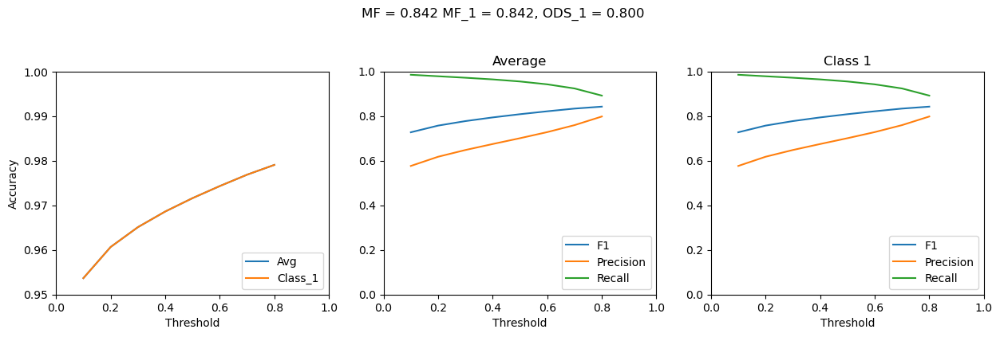

In [12]:
### Maximum F1 Score:
path = os.path.join(Model.Data.paths["FIGURES"], "threshold_metrics_evaluation_test_ds_pix_at_edge_0.svg")

Model.evaluate_and_plot_MF_score(model=model, dataset=test_ds, 
                                num_classes=DataProcessing.output_data_cfg["edge"]["num_classes"], 
                                num_pixels_region_of_attraction = 0.0,
                                path=path)

Max Accuracy Score = 0.982 at 0.600
MF1 = 0.797
MF1_1 = 0.797, ODS_1 = 0.600


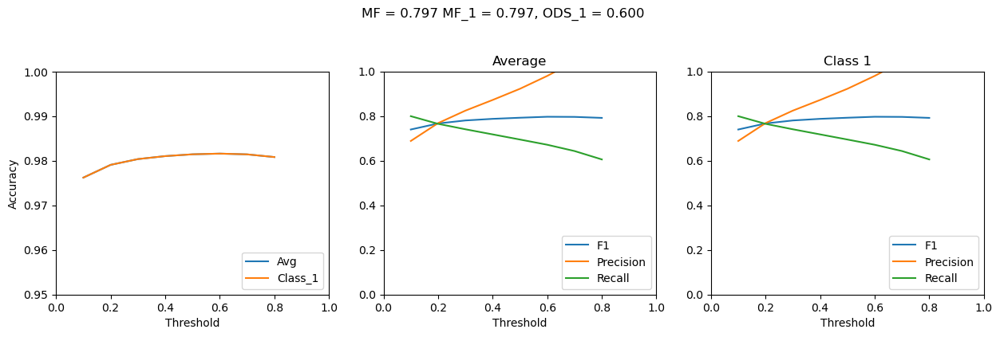

In [13]:
### Maximum F1 Score:
path = os.path.join(Model.Data.paths["FIGURES"],"threshold_metrics_evaluation_image_ds.svg")

Model.evaluate_and_plot_MF_score(model=model, dataset=real_world_ds, 
                                num_classes=DataProcessing.output_data_cfg["edge"]["num_classes"], 
                                path=path, threshold_edge_width=1.0)

In [14]:
if Model.cfg["CONVERT_TO_TFLITE"]:
    Model.convert_model_to_tflite(model)

2023-02-02 08:18:45.379625: W tensorflow/compiler/mlir/lite/python/tf_tfl_flatbuffer_helpers.cc:362] Ignored output_format.
2023-02-02 08:18:45.379654: W tensorflow/compiler/mlir/lite/python/tf_tfl_flatbuffer_helpers.cc:365] Ignored drop_control_dependency.
2023-02-02 08:18:45.380146: I tensorflow/cc/saved_model/reader.cc:45] Reading SavedModel from: /home/david/SemesterProject/Models/edge_detection/lite_edge/TFLITE
2023-02-02 08:18:45.420181: I tensorflow/cc/saved_model/reader.cc:89] Reading meta graph with tags { serve }
2023-02-02 08:18:45.420220: I tensorflow/cc/saved_model/reader.cc:130] Reading SavedModel debug info (if present) from: /home/david/SemesterProject/Models/edge_detection/lite_edge/TFLITE
2023-02-02 08:18:45.516267: I tensorflow/compiler/mlir/mlir_graph_optimization_pass.cc:354] MLIR V1 optimization pass is not enabled
2023-02-02 08:18:45.554455: I tensorflow/cc/saved_model/loader.cc:229] Restoring SavedModel bundle.
2023-02-02 08:18:46.569863: I tensorflow/cc/saved_m

=== TFLite ModelAnalyzer ===

Your TFLite model has '1' subgraph(s). In the subgraph description below,
T# represents the Tensor numbers. For example, in Subgraph#0, the DEQUANTIZE op takes
tensor #18 as input and produces tensor #192 as output.

Subgraph#0 main(T#0) -> [T#490]
  Op#0 DEQUANTIZE(T#18[]) -> [T#192]
  Op#1 DEQUANTIZE(T#19[]) -> [T#193]
  Op#2 DEQUANTIZE(T#20[]) -> [T#194]
  Op#3 DEQUANTIZE(T#21[]) -> [T#195]
  Op#4 DEQUANTIZE(T#22[]) -> [T#196]
  Op#5 DEQUANTIZE(T#23[]) -> [T#197]
  Op#6 DEQUANTIZE(T#24[]) -> [T#198]
  Op#7 DEQUANTIZE(T#25[]) -> [T#199]
  Op#8 DEQUANTIZE(T#26[]) -> [T#200]
  Op#9 DEQUANTIZE(T#27[]) -> [T#201]
  Op#10 DEQUANTIZE(T#28[]) -> [T#202]
  Op#11 DEQUANTIZE(T#29[]) -> [T#203]
  Op#12 DEQUANTIZE(T#30[]) -> [T#204]
  Op#13 DEQUANTIZE(T#31[]) -> [T#205]
  Op#14 DEQUANTIZE(T#32[]) -> [T#206]
  Op#15 DEQUANTIZE(T#33[]) -> [T#207]
  Op#16 DEQUANTIZE(T#34[]) -> [T#208]
  Op#17 DEQUANTIZE(T#35[]) -> [T#209]
  Op#18 DEQUANTIZE(T#36[]) -> [T#210]
  Op#19 D